In [1]:
# Importação de bibliotecas OpenCV, MatplotLib e Numpy
import cv2
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
mpl.rcParams['figure.figsize'] = (20.0, 10.0) #dimensões da janela do MatplotLib

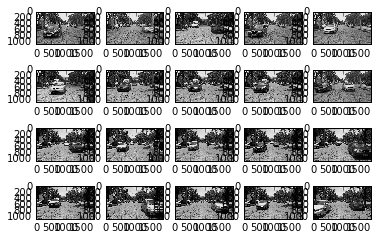

In [2]:
# Carregando as imagens e convertendo para escala de cinza

path = '../Data/' # caminho para a pasta das imagens
img_color = [] # vetor de imagens coloridas
img = [] # vetor de imagens em tons de cinza

# A cada iteração uma imagem é carregada e convertida para tons de cinza, ao passo que é armazenada nos vetores acima
for i in range(0,20): #A pasta data possui 20 imagens
    img_color.append(cv2.imread(path + str(i+1) + '.png'))
    img.append(cv2.cvtColor(img_color[i],cv2.COLOR_RGB2GRAY))
    plt.subplot(4,5,i+1)
    plt.imshow(img[i],cmap='gray')

(<matplotlib.image.AxesImage at 0x7f6fb8931d10>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

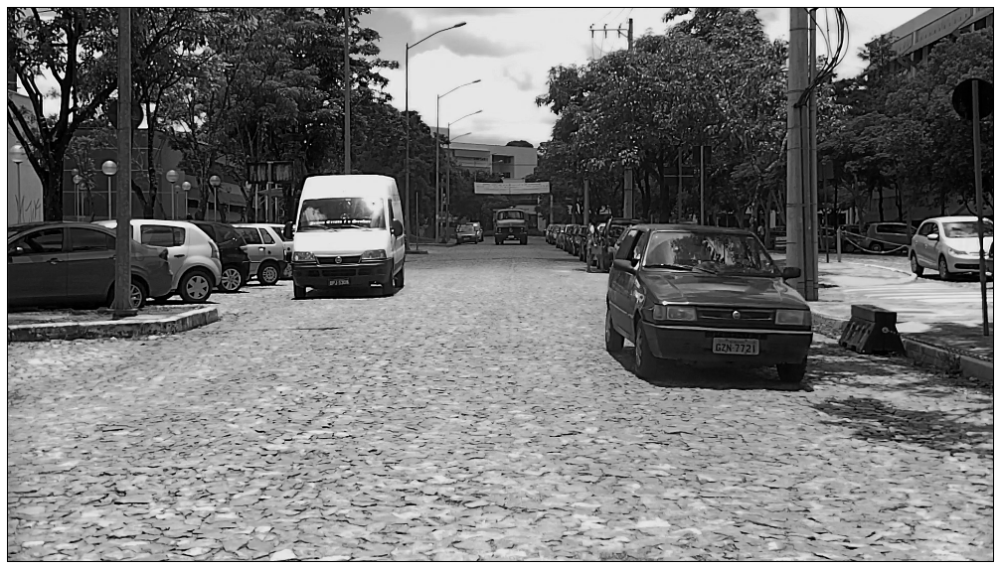

In [5]:
plt.imshow(img[2],'gray'), plt.xticks([]), plt.yticks([])

(([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

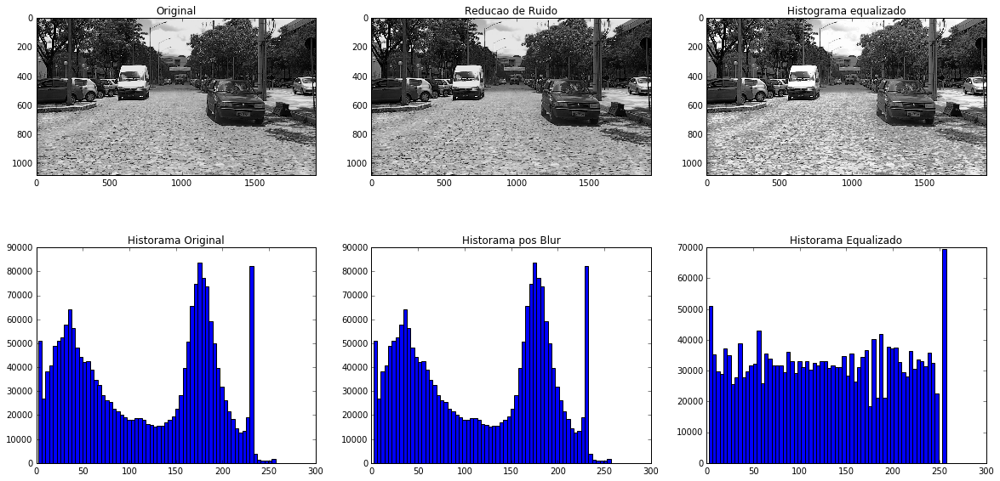

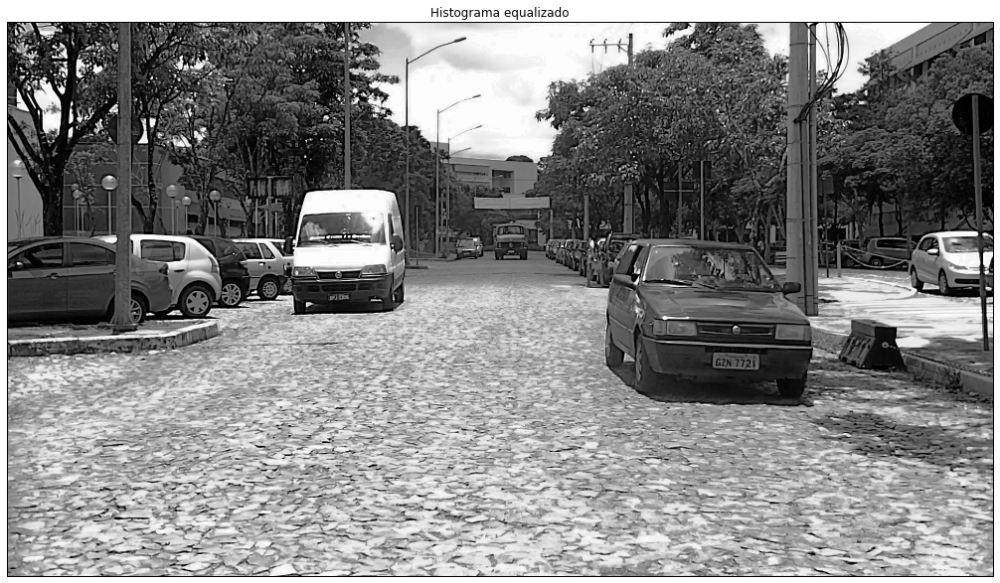

In [8]:
# Aplicação de filtro de Suavização e equalização de histograma

im = img[2]

mpl.rcParams['figure.figsize'] = (20.0, 10.0) #dimensões da janela do MatplotLib

plt.subplot(2,3,1)
plt.imshow(im,cmap='gray')
plt.title('Original')

#Histograma
nbins = 64
h, bin_edges = np.histogram(im, nbins,(0,255))
w=256./nbins
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,4)
plt.bar(bin_centers, h, width=w)
plt.title('Historama Original')

# Blur
plt.subplot(2,3,2)
#im = cv2.medianBlur(im,5) #mediana
#im = cv2.blur(im,(5,5)) #média
#im = cv2.bilateralFilter(im,5,20,20) #bilateral
plt.imshow(im,cmap='gray')
plt.title('Reducao de Ruido')

#Histograma
h, bin_edges = np.histogram(im, nbins,(0,255))
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,5)
plt.bar(bin_centers, h, width=w)
plt.title('Historama pos Blur')

# Equalização
plt.subplot(2,3,3)
im = cv2.equalizeHist(im)
plt.imshow(im,cmap='gray')
plt.title('Histograma equalizado')

#Histograma
h, bin_edges = np.histogram(im, nbins,(0,255))
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,6)
plt.bar(bin_centers, h, width=w)
plt.title('Historama Equalizado')

plt.figure()
plt.imshow(im,cmap='gray')
plt.title('Histograma equalizado')
plt.xticks([]), plt.yticks([])


(<matplotlib.image.AxesImage at 0x7f6fb107a610>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

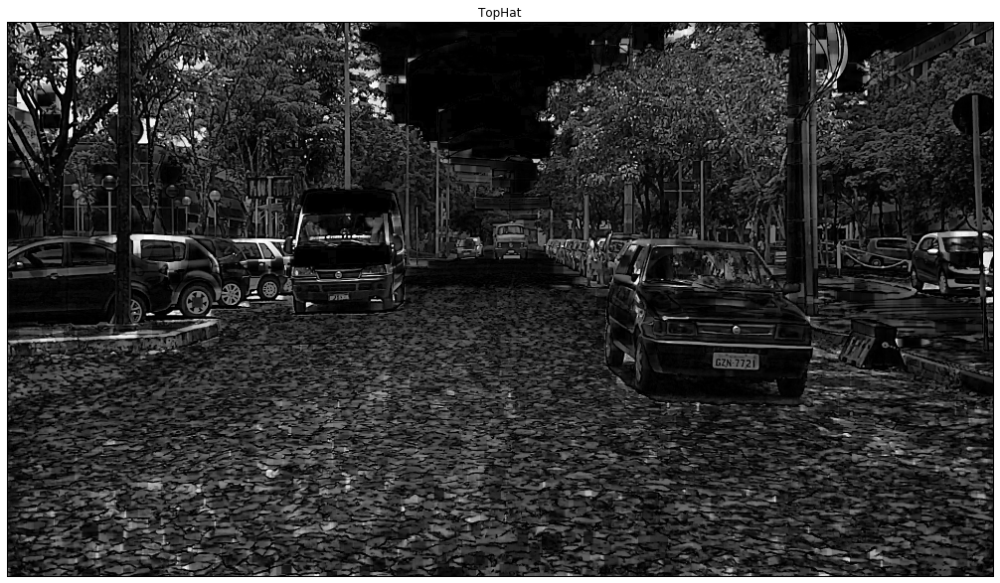

In [9]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(17,17)) # MORPH_RECT devido ao formato da placa 
morphTx = cv2.morphologyEx(im,cv2.MORPH_TOPHAT,kernel)
plt.imshow(morphTx,cmap = 'gray'),plt.title('TopHat'),plt.xticks([]), plt.yticks([])


(<matplotlib.image.AxesImage at 0x7f6fb10d2c10>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

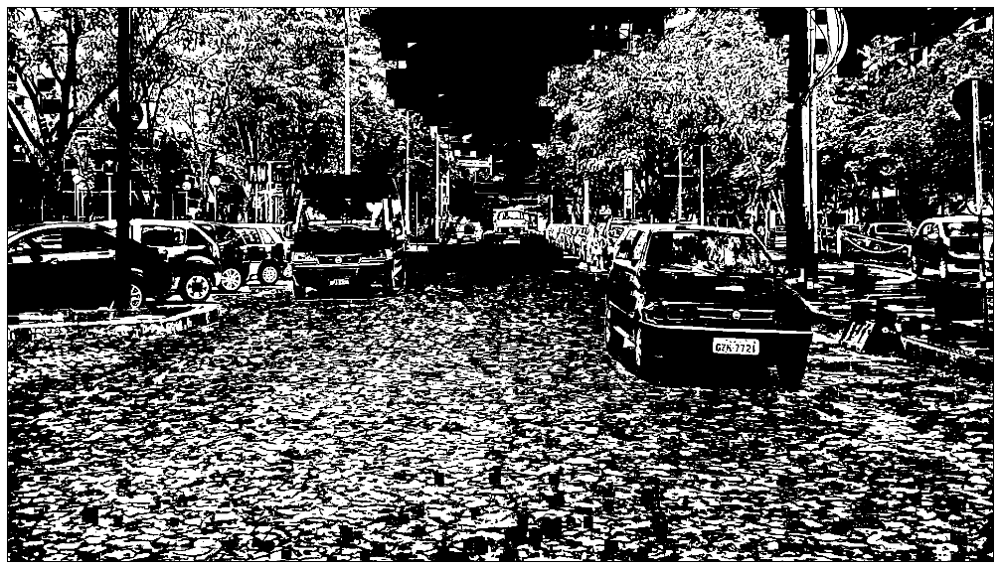

In [13]:
_,xthr = cv2.threshold(morphTx,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(xthr,cmap = 'gray'),plt.xticks([]), plt.yticks([])

(<matplotlib.axes._subplots.AxesSubplot at 0x7f6fb13db9d0>,
 <matplotlib.text.Text at 0x7f6fb12a1c10>)

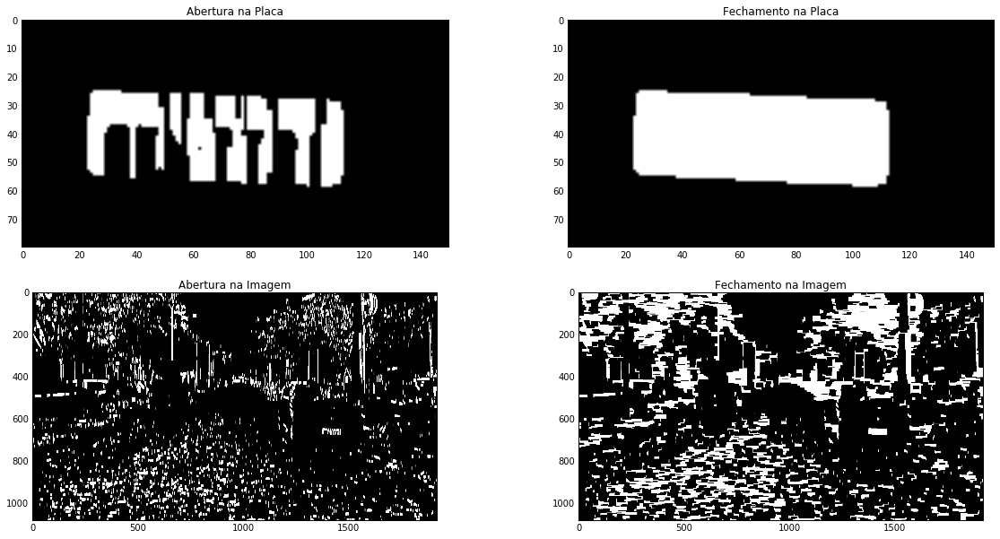

In [14]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(1,11)) # MORPH_RECT devido ao formato da placa 
morphAx = cv2.morphologyEx(xthr,cv2.MORPH_OPEN,kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(23,1)) # MORPH_RECT devido ao formato da placa 
morphFx = cv2.morphologyEx(morphAx,cv2.MORPH_CLOSE,kernel)

plt.subplot(221), plt.imshow(morphAx[620:700,1350:1500],cmap = 'gray'),plt.title('Abertura na Placa')
plt.subplot(223), plt.imshow(morphAx,cmap = 'gray'),plt.title('Abertura na Imagem')
plt.subplot(222), plt.imshow(morphFx[620:700,1350:1500],cmap = 'gray'),plt.title('Fechamento na Placa')
plt.subplot(224), plt.imshow(morphFx,cmap = 'gray'),plt.title('Fechamento na Imagem')

(<matplotlib.image.AxesImage at 0x7f6fb156c790>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

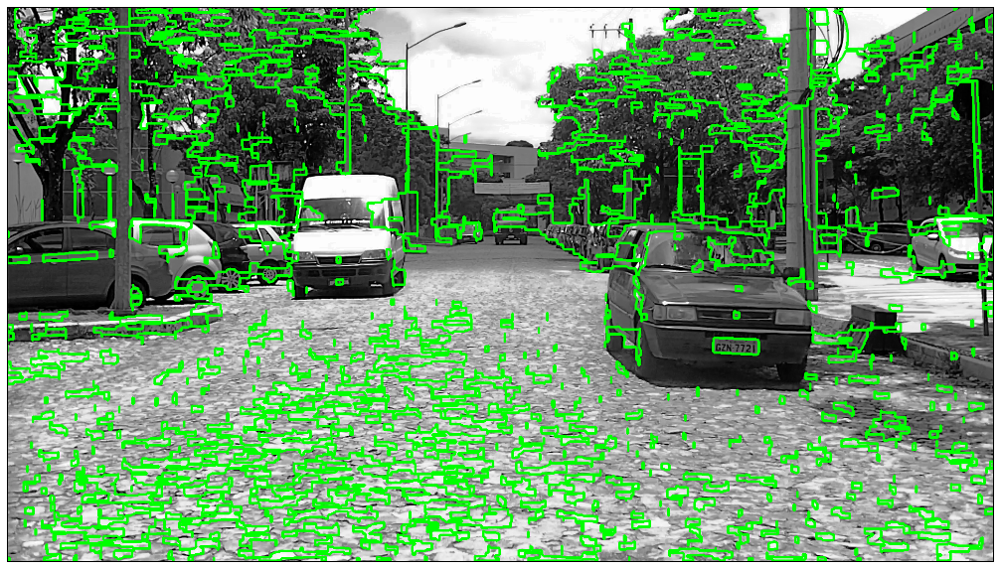

In [16]:
_,contours1, hierarch = cv2.findContours(morphFx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_cont1 = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
cv2.drawContours(img_cont1, contours1, -1, (0,255,0), 3)
plt.imshow(img_cont1,cmap='gray'),plt.xticks([]), plt.yticks([])

(<matplotlib.image.AxesImage at 0x7f6fb1944910>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

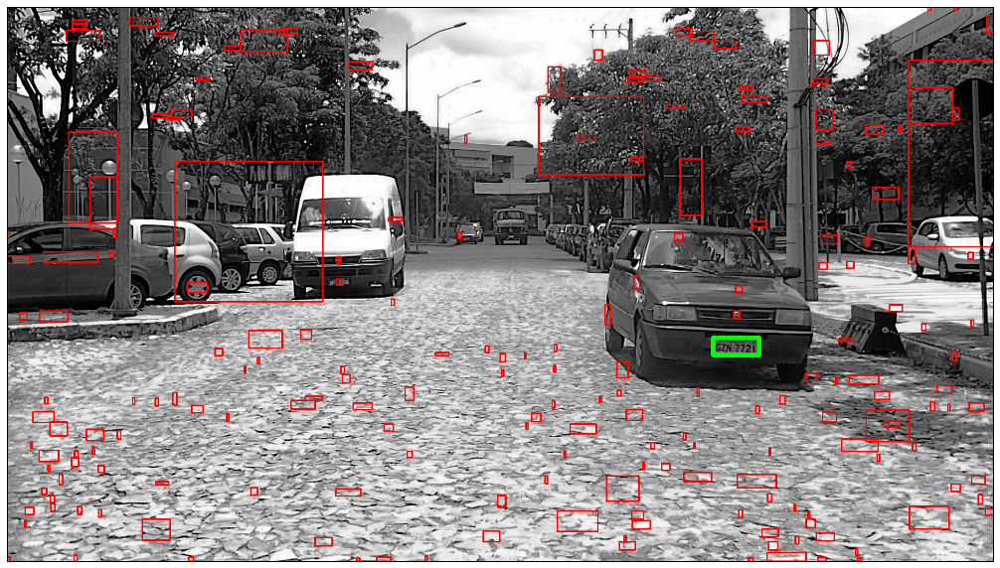

In [20]:
color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
minArea = 2700
maxArea = 20000
for cnt in contours1:
    epsilon = 0.05*cv2.arcLength(cnt,True)
    approx = cv2.approxPolyDP(cnt,epsilon,True)

    if(len(approx) == 4):
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),2)
        ar = 1.0*h/w
        #cv2.putText(color,str(round(ar, 2)),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)
        if(ar >= 0.3 and ar <= 0.4 and h*w > minArea  and h*w < maxArea):
            cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),8)  
plt.imshow(color,cmap='gray'),plt.xticks([]), plt.yticks([])

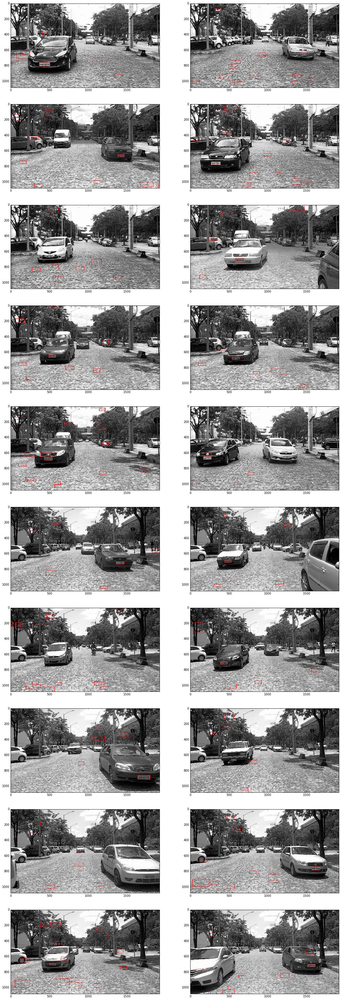

In [21]:
mpl.rcParams['figure.figsize'] = (20.0, 60.0) #dimensões da janela do MatplotLib
minArea = 2700 #definição da menor área de uma placa, baseado na menor placa de posível leitura
maxArea = 20000 #definição da maior área, baseado na maior placa encontrada (mais próxima da câmera)
#iteração sobe as 20 imagens
for i in range(0,20):
    im = img[i] # leitura de uma única imagem por vez
    im = cv2.equalizeHist(im) # equalização de histograma
    # Definição do Elemento Estruturante para o TOPHAT
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(17,17)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica TOPHAT
    morphTH = cv2.morphologyEx(im,cv2.MORPH_TOPHAT,kernel)
    # Limiarização por Otsu
    _,thr = cv2.threshold(morphTH,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # Definição do Elemento Estruturante para a ABERTURA
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(1,11)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica ABERTURA
    morphAx = cv2.morphologyEx(thr,cv2.MORPH_OPEN,kernel)
    # Definição do Elemento Estruturante para o FECHAMENTO
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(23,1)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica Fechamento
    morphFx = cv2.morphologyEx(morphAx,cv2.MORPH_CLOSE,kernel)
    # Busca de contornos
    _,contours1, hierarch = cv2.findContours(morphFx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR) # imagem colorida a partir de uma em grayscale para exibição
    # iteração bre todos os contornos no vetor contours1
    for cnt in contours1:
        # Aproximação Poligonal
        epsilon = 0.05*cv2.arcLength(cnt,True)
        approx = cv2.approxPolyDP(cnt,epsilon,True)
        # Seleção de contornos aproximados por quadrilátero 
        if(len(approx) == 4):
            # Criando as caixas delimitadoras e calculando o Aspect Ratio
            x,y,w,h = cv2.boundingRect(cnt)
            ar = 1.0*h/w 
            #cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),1)
            #cv2.putText(color,str(round(ar, 2)),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)
            if(ar >= 0.3 and ar <= 0.55 and h*w > minArea and h*w < maxArea): # Seleção por características
                cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),2)  
    plt.subplot(10,2,i+1)
    plt.imshow(color,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9fd73ca350>,
 <matplotlib.image.AxesImage at 0x7f9fd60f43d0>)

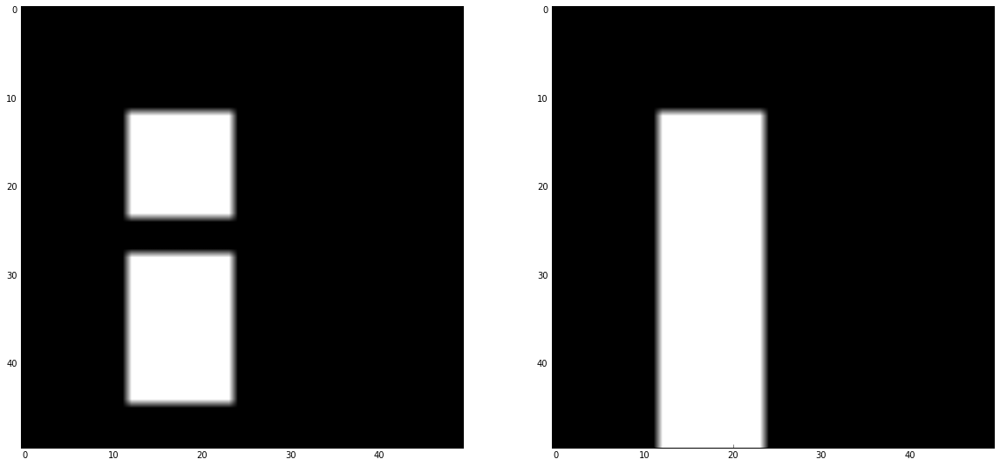

In [59]:
T = np.zeros([50,50])
T[12:24,12:24] = 1
T[28:45,12:24] = 1
kl = cv2.getStructuringElement(cv2.MORPH_RECT,(1,13)) # MORPH_RECT devido ao formato da placa 
mo = cv2.morphologyEx(T,cv2.MORPH_CLOSE,kl)
plt.subplot(121),plt.imshow(T,'gray')
plt.subplot(122),plt.imshow(mo,'gray')